In [1]:
from rdkit import Chem
from rdkit.Chem import Draw, Descriptors, rdMolTransforms
from rdkit.Chem import rdFreeSASA, rdMolDescriptors
from rdkit.Chem.Draw import IPythonConsole
from sklearn.metrics import pairwise_distances
from rdkit.Chem import AllChem
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
sdf_file = '/Users/charithrachandrashekar/Desktop/Everything Charithra/PESIT - DSML/Datasets.nosync/BindingDB_BindingDB_Articles_3D.sdf'
supplier = Chem.SDMolSupplier(sdf_file)

In [3]:
molecules = [ mol for mol in supplier if mol is not None]
len(molecules)

[17:21:13] Warning: molecule is tagged as 2D, but at least one Z coordinate is not zero. Marking the mol as 3D.
[17:21:13] Warning: molecule is tagged as 2D, but at least one Z coordinate is not zero. Marking the mol as 3D.
[17:21:13] Warning: molecule is tagged as 2D, but at least one Z coordinate is not zero. Marking the mol as 3D.
[17:21:13] Warning: molecule is tagged as 2D, but at least one Z coordinate is not zero. Marking the mol as 3D.
[17:21:13] Warning: molecule is tagged as 2D, but at least one Z coordinate is not zero. Marking the mol as 3D.
[17:21:13] Warning: molecule is tagged as 2D, but at least one Z coordinate is not zero. Marking the mol as 3D.
[17:21:13] Warning: molecule is tagged as 2D, but at least one Z coordinate is not zero. Marking the mol as 3D.
[17:21:13] Warning: molecule is tagged as 2D, but at least one Z coordinate is not zero. Marking the mol as 3D.
[17:21:13] Warning: molecule is tagged as 2D, but at least one Z coordinate is not zero. Marking the mol

93219

In [4]:
prop_names = molecules[121].GetPropNames()
for prop in prop_names:
    print(f"{prop}: {molecules[100].GetProp(prop)}")

From: www.bindingDB.org
BindingDB Reactant_set_id: 455106
Ligand InChI: InChI=1S/C18H19F3N2S/c1-22(2)10-5-11-23-14-6-3-4-7-16(14)24-17-9-8-13(12-15(17)23)18(19,20)21/h3-4,6-9,12H,5,10-11H2,1-2H3
Ligand InChI Key: XSCGXQMFQXDFCW-UHFFFAOYSA-N
BindingDB MonomerID: 67544
BindingDB Ligand Name: N,N-dimethyl-3-[2-(trifluoromethyl)-10-phenothiazinyl]-1-propanamine;hydrochloride::N,N-dimethyl-3-[2-(trifluoromethyl)phenothiazin-10-yl]propan-1-amine;hydrochloride::SR-01000000224-4::TRIFLUPROMAZINE::cid_66069::dimethyl-[3-[2-(trifluoromethyl)phenothiazin-10-yl]propyl]amine;hydrochloride::med.21724, Compound Triflupromazine
Target Name: Proteasome subunit alpha type-6
Target Source Organism According to Curator or DataSource: 
Ki (nM): 
IC50 (nM): 
Kd (nM): 
EC50 (nM):  7800
kon (M-1-s-1): 
koff (s-1): 
pH: 7.5
Temp C: 37.00
Curation/DataSource: Curated from the literature by BindingDB
Article DOI: 10.1021/acschembio.7b00489
BindingDB Entry DOI: 10.7270/Q2DV1H2F
PMID: 28719185
PubChem AID: aid1794

In [25]:
Draw.MolToImage(molecules[0]).show()

In [27]:
import py3Dmol

if molecules[0]:
    mol_block = Chem.MolToMolBlock(molecules[0])
    viewer = py3Dmol.view(width=400, height=400)
    viewer.addModel(mol_block, "mol")
    viewer.setStyle({'stick': {}})
    viewer.zoomTo()
    viewer.show()


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

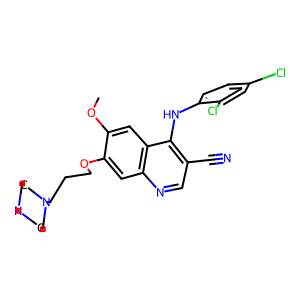

In [29]:
from IPython.display import display
display(Draw.MolToImage(molecules[0]))

In [32]:
options = Draw.DrawingOptions()
options.bgColor = None  # Sets a transparent background
img = Draw.MolToImage(molecules[0], options=options)
img.show()

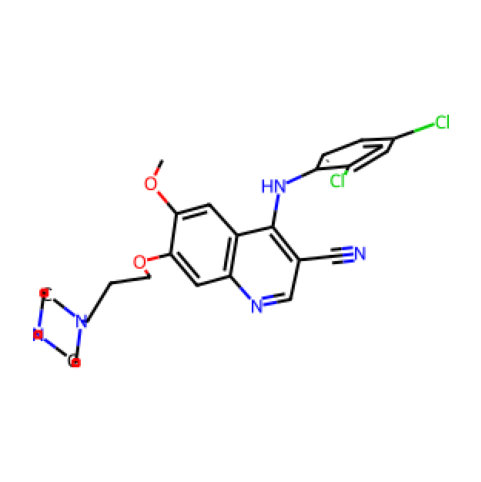

In [28]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(6, 6))
img = Draw.MolToImage(molecules[0])
ax.imshow(img)
ax.axis("off")
plt.show()


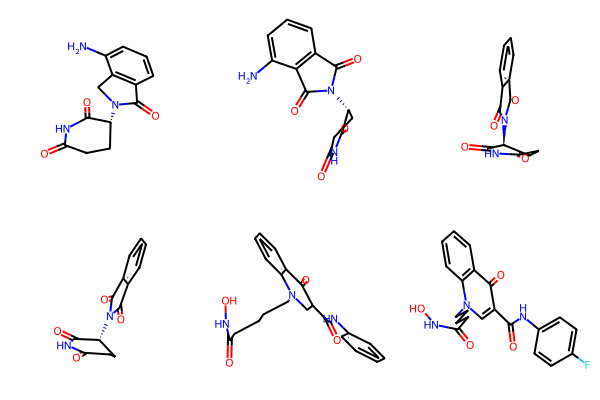

In [5]:
# Visualize the first few molecules
Draw.MolsToGridImage(molecules[50:56], molsPerRow=3)

In [6]:
def get_binding_affinity(mol):
    affinity = None
    affinity_types = ['Kd (nM)', 'Ki (nM)', 'IC50 (nM)', 'EC50 (nM)']
    for prop in affinity_types:
        if mol.HasProp(prop):
            value = mol.GetProp(prop)
            try:
                affinity = float(value)
                break
            except ValueError:
                pass  # Handle non-numeric values
    return affinity

def get_atom_coordinates(mol):
    conformer = mol.GetConformer()
    coords = []
    for atom in mol.GetAtoms():
        pos = conformer.GetAtomPosition(atom.GetIdx())
        coords.append([pos.x, pos.y, pos.z])
    return coords


In [7]:
def get_property_value(mol, prop):
    affinity = None
    if mol.HasProp(prop):
        value = mol.GetProp(prop)
        try:
            affinity = float(value)
        except ValueError:
            pass  # Handle non-numeric values
    return affinity

In [8]:
# Define functions to extract molecular properties
def get_molecular_properties(mol):
    return {
        'Ligand Name': mol.GetProp('_Name') if mol.HasProp('_Name') else 'No Name',
        'SMILES': Chem.MolToSmiles(mol),
        'Molecular Weight': Descriptors.MolWt(mol),
        'LogP': Descriptors.MolLogP(mol),
        'HBD': Descriptors.NumHDonors(mol),
        'HBA': Descriptors.NumHAcceptors(mol),
        'Num Rotatable Bonds': Descriptors.NumRotatableBonds(mol),
        'TPSA': Descriptors.TPSA(mol),
        'protein_id': mol.GetProp('Target Name') if mol.HasProp('Target Name') else None,
        'protein_sequence': mol.GetProp('BindingDB Target Chain Sequence') if mol.HasProp('BindingDB Target Chain Sequence') else None,
        'Binding affinity': get_binding_affinity(mol),
        'Kd (nM)': get_property_value(mol, 'Kd (nM)'),
        'Ki (nM)': get_property_value(mol, 'Ki (nM)'),
        'IC50 (nM)': get_property_value(mol, 'IC50 (nM)'),
        'EC50 (nM)': get_property_value(mol, 'EC50 (nM)'),
        'Atom coordinates': get_atom_coordinates(mol),
    }

# Extract properties for all molecules
molecular_data = [get_molecular_properties(mol) for mol in molecules]

# Convert to pandas DataFrame for analysis
import pandas as pd
df = pd.DataFrame(molecular_data)
df.head()

,Ligand Name,SMILES,Molecular Weight,LogP,HBD,HBA,Num Rotatable Bonds,TPSA,protein_id,protein_sequence,Binding affinity,Kd (nM),Ki (nM),IC50 (nM),EC50 (nM),Atom coordinates
0,4-_2_4-Dichlorophenylamino_-3-quinolinecarboni...,COc1cc2c(Nc3ccc(Cl)cc3Cl)c(C#N)cnc2cc1OCCCN1CC...,500.430,5.18178,1,7,8,73.65,Proto-oncogene tyrosine-protein kinase Src,MGSNKSKPKDASQRRRSLEPAENVHGAGGGAFPASQTPSKPASADG...,8.7,NaN,NaN,8.7,NaN,"[[-0.995, 1.788, 1.368], [-2.069, 1.488, 0.511..."
1,3-quinolinecarbonitrile,COc1cc2c(Nc3cc(OC)c(OC)c(OC)c3)c(C#N)cnc2cc1OC...,521.618,3.90078,1,10,11,101.34,Proto-oncogene tyrosine-protein kinase Src,MGSNKSKPKDASQRRRSLEPAENVHGAGGGAFPASQTPSKPASADG...,5.1,NaN,NaN,5.1,NaN,"[[0.966, 4.222, 0.505], [-0.271, 3.574, 0.339]..."
2,3-quinolinecarbonitrile,COCCOc1cc2ncc(C#N)c(Nc3cc(OC)c(Cl)cc3Cl)c2cc1O...,492.359,5.21588,1,8,11,94.86,Proto-oncogene tyrosine-protein kinase Src,MGSNKSKPKDASQRRRSLEPAENVHGAGGGAFPASQTPSKPASADG...,2.8,NaN,NaN,2.8,NaN,"[[0.818, 4.186, 0.478], [-0.375, 3.442, 0.383]..."
3,3-quinolinecarbonitrile,COCCOc1cc2ncc(C#N)c(Nc3ccc(Cl)cc3Cl)c2cc1OCCOC,462.333,5.20728,1,7,10,85.63,Proto-oncogene tyrosine-protein kinase Src,MGSNKSKPKDASQRRRSLEPAENVHGAGGGAFPASQTPSKPASADG...,12.0,NaN,NaN,12.0,NaN,"[[0.891, 4.215, 0.572], [-0.331, 3.537, 0.415]..."
4,3-quinolinecarbonitrile,COCCOc1cc2ncc(C#N)c(Nc3cc(OC)c(OC)c(OC)c3)c2cc...,483.521,3.92628,1,10,13,113.32,Proto-oncogene tyrosine-protein kinase Src,MGSNKSKPKDASQRRRSLEPAENVHGAGGGAFPASQTPSKPASADG...,25.0,NaN,NaN,25.0,NaN,"[[0.839, 4.238, 0.555], [-0.357, 3.534, 0.314]..."


In [9]:
df.tail()

,Ligand Name,SMILES,Molecular Weight,LogP,HBD,HBA,Num Rotatable Bonds,TPSA,protein_id,protein_sequence,Binding affinity,Kd (nM),Ki (nM),IC50 (nM),EC50 (nM),Atom coordinates
93214,00215001.cdx,C[C@H]1CN(C)CCN1c1cc(NC(=O)Cn2cc(-c3cc(C(N)=O)...,645.042,2.8604,3,10,6,151.61,B-cell lymphoma 6 protein [5-128],ADSCIQFTRHASDVLLNLNRLRSRDILTDVVIVVSREQFRAHKTVL...,6.0,6.0,NaN,NaN,NaN,"[[-1.847, 1.246, 1.469], [-1.973, 2.258, 0.574..."
93215,00255001.cdx,C[C@H]1CN(C)CCN1c1cc(NC(=O)Cn2cc(-c3cc(C(N)=O)...,659.069,3.2505,3,10,6,151.61,B-cell lymphoma 6 protein [5-128],ADSCIQFTRHASDVLLNLNRLRSRDILTDVVIVVSREQFRAHKTVL...,26.0,26.0,NaN,NaN,NaN,"[[-2.97, 2.218, 0.353], [-3.99, 2.332, 1.29], ..."
93216,00255001.cdx,C[C@H]1CN(C)CCN1c1cc(NC(=O)Cn2cc(-c3cc(C(N)=O)...,659.069,3.2505,3,10,6,151.61,B-cell lymphoma 6 protein [5-128],ADSCIQFTRHASDVLLNLNRLRSRDILTDVVIVVSREQFRAHKTVL...,26.0,26.0,NaN,NaN,NaN,"[[-2.97, 2.218, 0.353], [-3.99, 2.332, 1.29], ..."
93217,00263001.cdx,C[C@H]1CN(C)CCN1c1cc(NC(=O)Cn2cc(-c3cc(C(N)=O)...,673.096,3.6406,3,10,6,151.61,B-cell lymphoma 6 protein [5-128],ADSCIQFTRHASDVLLNLNRLRSRDILTDVVIVVSREQFRAHKTVL...,47.0,47.0,NaN,NaN,NaN,"[[-2.036, 2.731, 1.921], [-2.218, 2.49, 3.274]..."
93218,00263001.cdx,C[C@H]1CN(C)CCN1c1cc(NC(=O)Cn2cc(-c3cc(C(N)=O)...,673.096,3.6406,3,10,6,151.61,B-cell lymphoma 6 protein [5-128],ADSCIQFTRHASDVLLNLNRLRSRDILTDVVIVVSREQFRAHKTVL...,47.0,47.0,NaN,NaN,NaN,"[[-2.036, 2.731, 1.921], [-2.218, 2.49, 3.274]..."


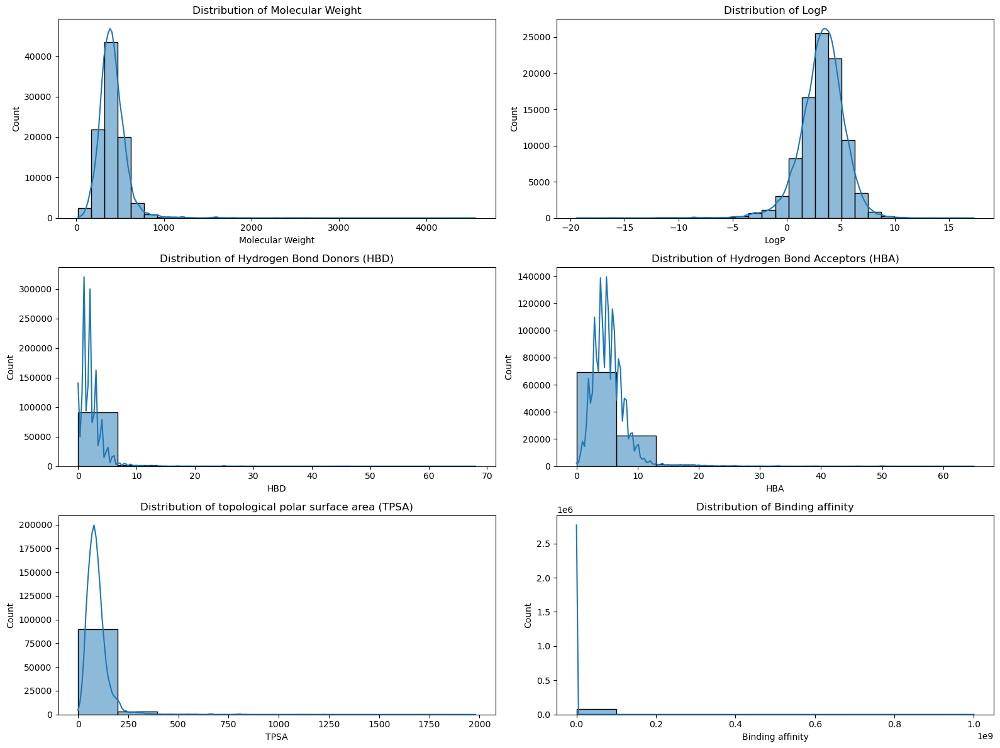

In [10]:
# Plot distributions of molecular properties
plt.figure(figsize=(16, 12))

# Plot molecular weight distribution
plt.subplot(3, 2, 1)
sns.histplot(df['Molecular Weight'], bins=30, kde=True)
plt.title('Distribution of Molecular Weight')

# Plot LogP distribution
plt.subplot(3, 2, 2)
sns.histplot(df['LogP'], bins=30, kde=True)
plt.title('Distribution of LogP')

# Plot HBD distribution
plt.subplot(3, 2, 3)
sns.histplot(df['HBD'], bins=10, kde=True)
plt.title('Distribution of Hydrogen Bond Donors (HBD)')

# Plot HBA distribution
plt.subplot(3, 2, 4)
sns.histplot(df['HBA'], bins=10, kde=True)
plt.title('Distribution of Hydrogen Bond Acceptors (HBA)')

# Plot TPSA distribution
plt.subplot(3, 2, 5)
sns.histplot(df['TPSA'], bins=10, kde=True)
plt.title('Distribution of topological polar surface area (TPSA)')

# Plot HBA distribution
plt.subplot(3, 2, 6)
sns.histplot(df['Binding affinity'], bins=10, kde=True)
plt.title('Distribution of Binding affinity')

plt.tight_layout()
plt.show()


In [11]:
ki_range = (df['Ki (nM)'].dropna().min(), df['Ki (nM)'].dropna().max())
ic50_range = (df['IC50 (nM)'].dropna().min(), df['IC50 (nM)'].dropna().max())
kd_range = (df['Kd (nM)'].dropna().min(), df['Kd (nM)'].dropna().max())
ec50_range = (df['EC50 (nM)'].dropna().min(), df['EC50 (nM)'].dropna().max())

print(f"Ki Range: {ki_range}")
print(f"IC50 Range: {ic50_range}")
print(f"Kd Range: {kd_range}")
print(f"EC50 Range: {ec50_range}")

Ki Range: (6e-06, 1000000000.0)
IC50 Range: (0.003, 459000000.0)
Kd Range: (4.7e-05, 76804000.0)
EC50 Range: (0.013, 2750000.0)


In [12]:
df.dtypes

Ligand Name             object
SMILES                  object
Molecular Weight       float64
LogP                   float64
HBD                      int64
HBA                      int64
Num Rotatable Bonds      int64
TPSA                   float64
protein_id              object
protein_sequence        object
Binding affinity       float64
Kd (nM)                float64
Ki (nM)                float64
IC50 (nM)              float64
EC50 (nM)              float64
Atom coordinates        object
dtype: object

In [13]:
print(f"Ki Range: {df['Ki (nM)'].dropna().describe()}")
print(f"IC50 Range: {df['IC50 (nM)'].dropna().describe()}")
print(f"Kd Range: {df['Kd (nM)'].dropna().describe()}")
print(f"EC50 Range: {df['EC50 (nM)'].dropna().describe()}")

Ki Range: count    2.171000e+04
mean     7.427924e+05
std      2.004444e+07
min      6.000000e-06
25%      1.500000e+01
50%      1.962500e+02
75%      2.900000e+03
max      1.000000e+09
Name: Ki (nM), dtype: float64
IC50 Range: count    5.494200e+04
mean     9.666369e+04
std      3.859142e+06
min      3.000000e-03
25%      6.000000e+01
50%      7.990000e+02
75%      9.100000e+03
max      4.590000e+08
Name: IC50 (nM), dtype: float64
Kd Range: count    2.493000e+03
mean     1.803662e+05
std      2.207514e+06
min      4.700000e-05
25%      2.000000e+01
50%      6.000000e+02
75%      1.100000e+04
max      7.680400e+07
Name: Kd (nM), dtype: float64
EC50 Range: count    4.037000e+03
mean     4.447928e+03
std      4.745001e+04
min      1.300000e-02
25%      2.200000e+01
50%      1.900000e+02
75%      1.510000e+03
max      2.750000e+06
Name: EC50 (nM), dtype: float64


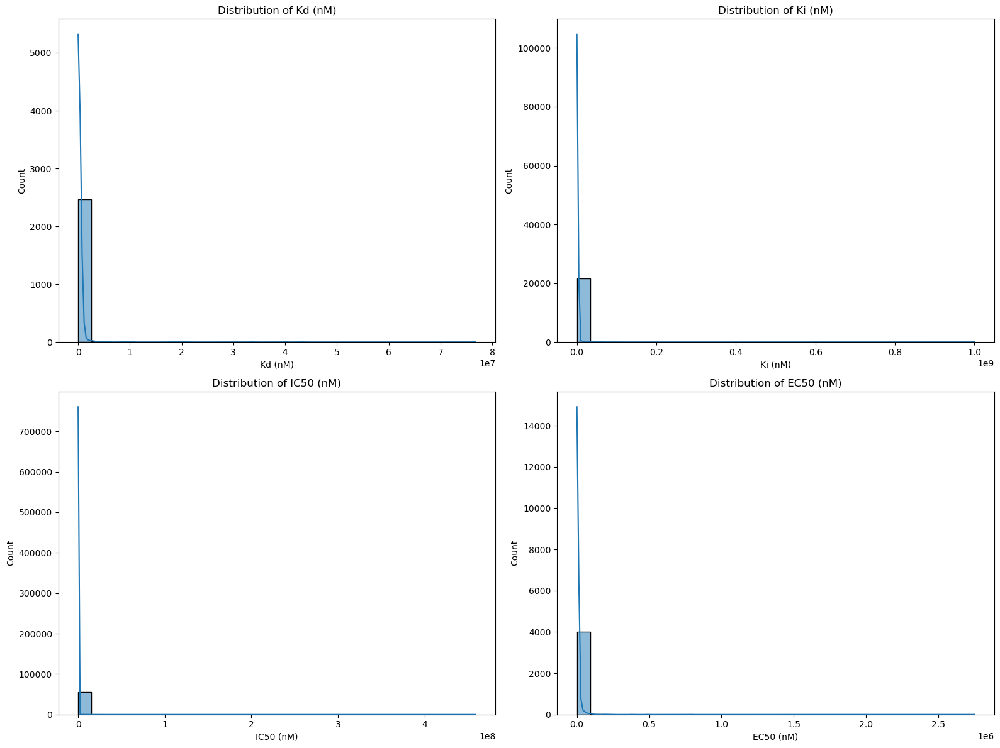

In [14]:
# Plot distributions of molecular properties
plt.figure(figsize=(16, 12))

# Plot Kd (nM) distribution
plt.subplot(2, 2, 1)
sns.histplot(df['Kd (nM)'].dropna(), bins=30, kde=True)
plt.title('Distribution of Kd (nM)')

# Plot Ki (nM) distribution
plt.subplot(2, 2, 2)
sns.histplot(df['Ki (nM)'].dropna(), bins=30, kde=True)
plt.title('Distribution of Ki (nM)')

# Plot IC50 (nM) distribution
plt.subplot(2, 2, 3)
sns.histplot(df['IC50 (nM)'].dropna(), bins=30, kde=True)
plt.title('Distribution of IC50 (nM)')

# Plot EC50 (nM) distribution
plt.subplot(2, 2, 4)
sns.histplot(df['EC50 (nM)'].dropna(), bins=30, kde=True)
plt.title('Distribution of EC50 (nM)')

plt.tight_layout()
plt.show()

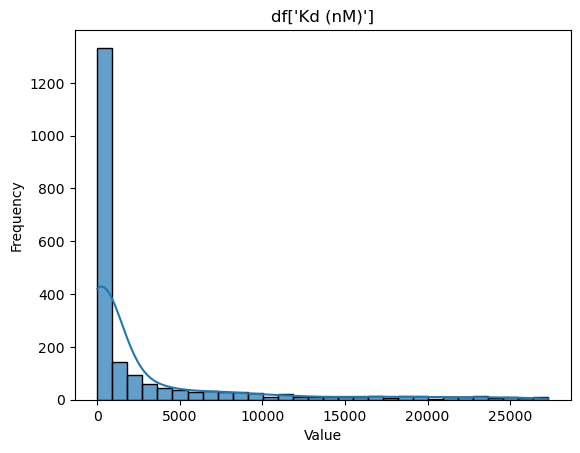

In [40]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

data = df['Kd (nM)'].dropna()

# Step 1: Calculate IQR
Q1 = np.percentile(data, 25)  # 25th percentile (Q1)
Q3 = np.percentile(data, 75)  # 75th percentile (Q3)
IQR = Q3 - Q1

# Define the lower and upper bounds to exclude outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Step 2: Filter the data
filtered_data = data[(data >= lower_bound) & (data <= upper_bound)]

# Step 3: Plot the histogram without outliers
sns.histplot(filtered_data, kde=True, bins=30, alpha=0.7)
plt.title("df['Kd (nM)']")
plt.xlabel("Value")
plt.ylabel("Frequency")
plt.show()


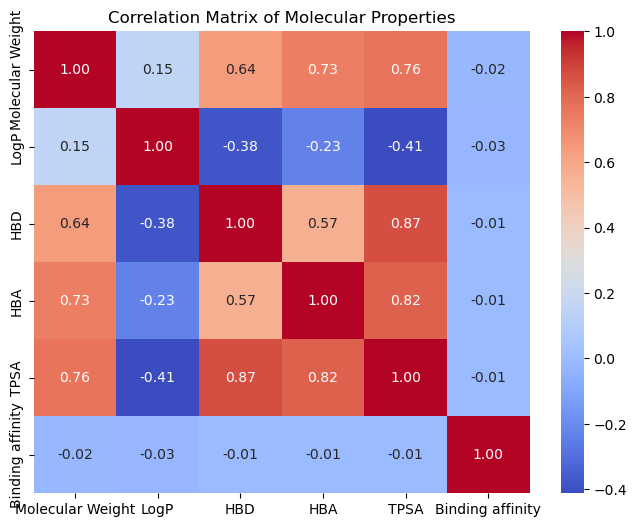

In [15]:
# Compute the correlation matrix
correlation_matrix = df[['Molecular Weight', 'LogP', 'HBD', 'HBA', 'TPSA', 'Binding affinity']].corr()

# Plot the correlation matrix
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix of Molecular Properties')
plt.show()

In [16]:
df.head()

,Ligand Name,SMILES,Molecular Weight,LogP,HBD,HBA,Num Rotatable Bonds,TPSA,protein_id,protein_sequence,Binding affinity,Kd (nM),Ki (nM),IC50 (nM),EC50 (nM),Atom coordinates
0,4-_2_4-Dichlorophenylamino_-3-quinolinecarboni...,COc1cc2c(Nc3ccc(Cl)cc3Cl)c(C#N)cnc2cc1OCCCN1CC...,500.430,5.18178,1,7,8,73.65,Proto-oncogene tyrosine-protein kinase Src,MGSNKSKPKDASQRRRSLEPAENVHGAGGGAFPASQTPSKPASADG...,8.7,NaN,NaN,8.7,NaN,"[[-0.995, 1.788, 1.368], [-2.069, 1.488, 0.511..."
1,3-quinolinecarbonitrile,COc1cc2c(Nc3cc(OC)c(OC)c(OC)c3)c(C#N)cnc2cc1OC...,521.618,3.90078,1,10,11,101.34,Proto-oncogene tyrosine-protein kinase Src,MGSNKSKPKDASQRRRSLEPAENVHGAGGGAFPASQTPSKPASADG...,5.1,NaN,NaN,5.1,NaN,"[[0.966, 4.222, 0.505], [-0.271, 3.574, 0.339]..."
2,3-quinolinecarbonitrile,COCCOc1cc2ncc(C#N)c(Nc3cc(OC)c(Cl)cc3Cl)c2cc1O...,492.359,5.21588,1,8,11,94.86,Proto-oncogene tyrosine-protein kinase Src,MGSNKSKPKDASQRRRSLEPAENVHGAGGGAFPASQTPSKPASADG...,2.8,NaN,NaN,2.8,NaN,"[[0.818, 4.186, 0.478], [-0.375, 3.442, 0.383]..."
3,3-quinolinecarbonitrile,COCCOc1cc2ncc(C#N)c(Nc3ccc(Cl)cc3Cl)c2cc1OCCOC,462.333,5.20728,1,7,10,85.63,Proto-oncogene tyrosine-protein kinase Src,MGSNKSKPKDASQRRRSLEPAENVHGAGGGAFPASQTPSKPASADG...,12.0,NaN,NaN,12.0,NaN,"[[0.891, 4.215, 0.572], [-0.331, 3.537, 0.415]..."
4,3-quinolinecarbonitrile,COCCOc1cc2ncc(C#N)c(Nc3cc(OC)c(OC)c(OC)c3)c2cc...,483.521,3.92628,1,10,13,113.32,Proto-oncogene tyrosine-protein kinase Src,MGSNKSKPKDASQRRRSLEPAENVHGAGGGAFPASQTPSKPASADG...,25.0,NaN,NaN,25.0,NaN,"[[0.839, 4.238, 0.555], [-0.357, 3.534, 0.314]..."


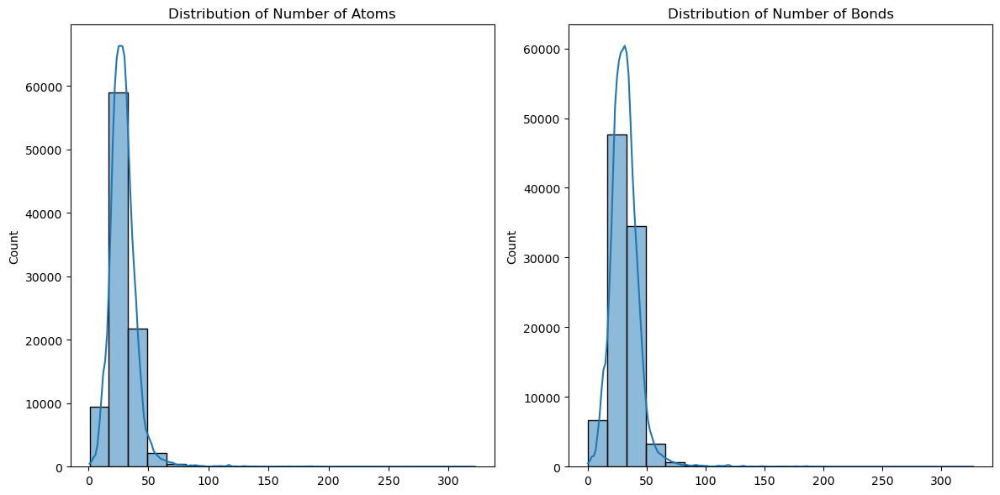

In [17]:
# Visualize the first few molecules in 2D
Draw.MolsToGridImage(molecules[:5], molsPerRow=5)

# Analyze molecular graphs (e.g., number of atoms, bonds)
num_atoms = [mol.GetNumAtoms() for mol in molecules]
num_bonds = [mol.GetNumBonds() for mol in molecules]

# Plot distribution of number of atoms and bonds
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.histplot(num_atoms, bins=20, kde=True)
plt.title('Distribution of Number of Atoms')

plt.subplot(1, 2, 2)
sns.histplot(num_bonds, bins=20, kde=True)
plt.title('Distribution of Number of Bonds')

plt.tight_layout()
plt.show()

In [19]:
# from rdkit.Chem import rdMolDraw2rd
from rdkit.Chem.Draw import MolToImage

# Visualize 3D molecular structure using RDKit
img = MolToImage(molecules[0], size=(400, 400), kekulize=True)
img.show()

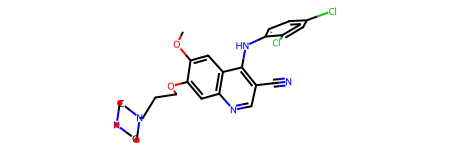

In [20]:
IPythonConsole.ipython_useSVG=True
molecules[0]

In [46]:
df['protein_id'].value_counts()

protein_id
Replicase polyprotein 1ab                                                                                                                  7143
Acetylcholinesterase                                                                                                                       1886
Dimer of Gag-Pol polyprotein [489-587]                                                                                                     1675
Vascular endothelial growth factor receptor 2                                                                                              1323
Carbonic anhydrase 2                                                                                                                       1284
                                                                                                                                           ... 
Phosphatidylinositol 4,5-bisphosphate 3-kinase catalytic subunit delta isoform/Platelet-derived growth factor receptor beta [

In [21]:
df['protein_id'].nunique()

2003

In [22]:
df['Ligand Name'].nunique()

27815

In [24]:
from sklearn.model_selection import train_test_split

train_data, test_data = train_test_split(df, test_size=0.2, random_state=42)
train_data.to_csv('data/train.csv')
test_data.to_csv('data/test.csv')